# Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install opencv-python                      # install opencv

In [ ]:
import cv2                                      # for image operations
import matplotlib.pyplot as plt                 # for visualisation
import numpy as np                              # for numerical operations
from google.colab.patches import cv2_imshow     # for displaying images on colab

In [ ]:
# define the path to the image folder

image_folder = "/content/drive/MyDrive/EE417/Labs/images"

# Helpers

In [ ]:
def plot_side_by_side(img_1, img_2, title1="Original Image", title2="Processed Image"):
    """
    A function to plot two images side by side.
    """
    if len(img_1.shape) == 3 or len(img_2.shape) == 3:
        img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
        img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)

    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].imshow(img_1, cmap='gray')
    axs[1].imshow(img_2, cmap='gray')

    axs[0].set_title(title1)
    axs[1].set_title(title2)

# 1. Fourier Transform

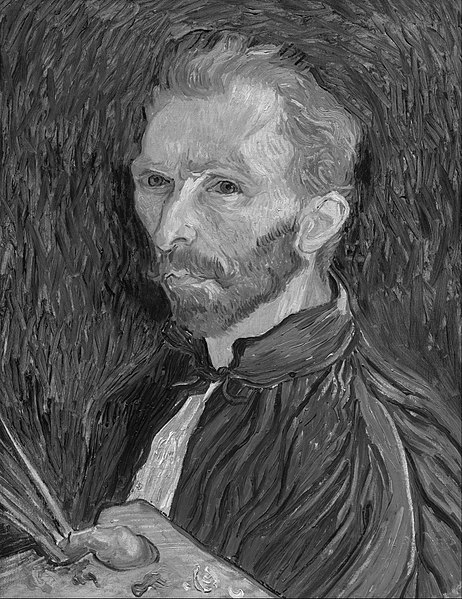

In [ ]:
van_gogh_gray = cv2.imread(f"{image_folder}/van_gogh.jpg", 0)
cv2_imshow(van_gogh_gray)

> Do not forget to shift the Fourier Transform to bring the zero-frequency component (also known as the DC component) to the center of the transformed image. This shift makes it easier to analyze the transformed image visually and to interpret the frequency content correctly.

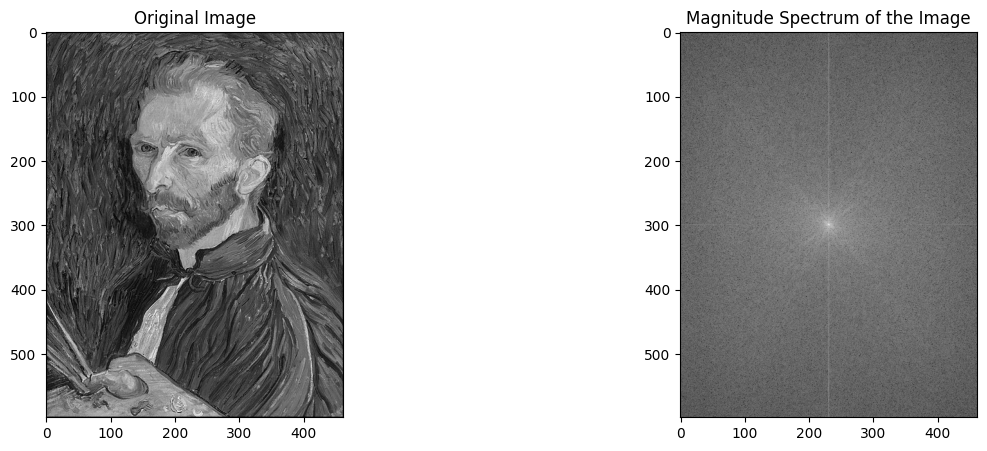

In [ ]:
fourier = np.fft.fft2(van_gogh_gray)                                                # compute the 2D Fourier Transform
f_transform_shifted = np.fft.fftshift(fourier)                                      # shift the zero-frequency component
magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted))                       # log magnitude transform - make the frequency components more visible

# we calculate the magnitude spectrum using np.abs() to get the absolute values (to remove imaginary components) and np.log() to scale the values for better visualization.

plot_side_by_side(van_gogh_gray, magnitude_spectrum, title2="Magnitude Spectrum of the Image")

# the white vertical line refer to the sharp horizontal elements of the image

In [ ]:
# fourier = np.fft.fftshift(np.fft.fft2(van_gogh_gray))       # compute the 2d fourier transform
# fourier_masked = fourier.copy()                             # copy the fourier transform
# fourier_masked[:, 232:235] = 0                              # mask the frequency components
# image_masked = abs(np.fft.ifft2(fourier_masked))            # inverse fourier transform to get the image


# fig, ax = plt.subplots(1, 4, figsize=(15,15))

# ax[0].imshow(np.log(abs(fourier)), cmap='gray')
# ax[0].set_title('Fourier')
# ax[1].imshow(np.log(abs(fourier_masked)), cmap='gray')
# ax[1].set_title('Masked Fourier')
# ax[2].imshow(van_gogh_gray, cmap = 'gray')
# ax[2].set_title('Greyscale Image')
# ax[3].imshow(image_masked, cmap='gray')
# ax[3].set_title('Transformed Greyscale Image')

## ***Exercise 1.1*** - Implement Forward Fourier Transform from Scratch

> P.S. Do not forget to read the image in grayscale.

![image](https://github.com/d2l-ai/d2l-en/assets/52993055/2659a0fb-8b08-468b-b505-d061823c5ebe)

In [ ]:
def fft_2d(image):

    height, width = image.shape
    F = np.zeros((height, width),dtype=complex) # to store the fourier transform

    # iterate over each frequency component (u, v)
    for u in range(height):     # vertical frequency component
        for v in range(width):  # horizontal frequency component

            f_uv = 0            # initialize the sum for the Fourier coefficient

            # iterate over each pixel (x, y)
            # within each frequency component (u, v), we need to compute the contribution of each pixel (x, y) in the spatial domain

            for y in range(height):
                for x in range(width):
                    e = np.exp(- 2j * np.pi * ((u * y) / height + (v * x) / width))
                    f_uv +=  image[y, x] * e

            F[u, v] = f_uv / (width * height)

    return F

def fft_shift(F):
    height, width = F.shape
    shifted_F = np.zeros((height, width),dtype=complex)

    for i in range(height):
        for j in range(width):
            shifted_F[i, j] = F[(i + height // 2) % height, (j + width // 2) % width]

    return shifted_F

> ***Note:*** `(i + height // 2) % height` This expression calculates the row index. It adds half of the height to the current row index `i`, then takes the remainder when divided by the total height. This ensures that if the index goes beyond the boundaries of the array, it wraps around to the beginning.

(1143, 1883)
(50, 80)


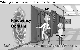

In [ ]:
img = cv2.imread(f"{image_folder}/fourier.png", 0)
print(img.shape)

img = cv2.resize(img, (80, 50))

print(img.shape)

cv2_imshow(img)

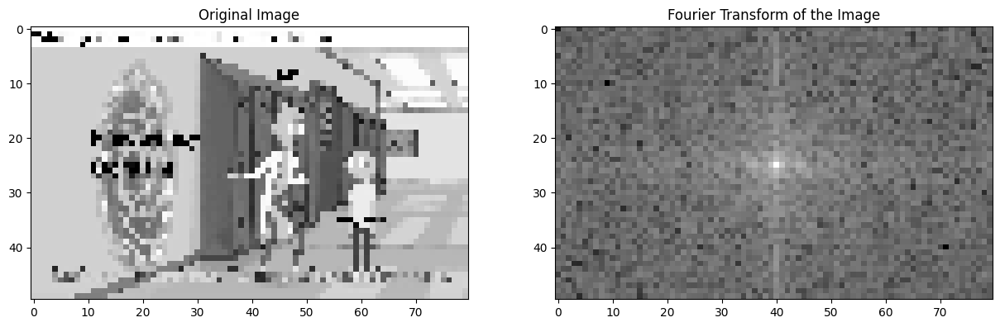

In [ ]:
fourier = fft_2d(img)
fourier_shifted = fft_shift(fourier)

magnitude_spectrum = 20 * np.log(np.abs(fourier_shifted))                       # log magnitude transform - make the frequency components more visible

plot_side_by_side(img, magnitude_spectrum, title2="Fourier Transform of the Image")

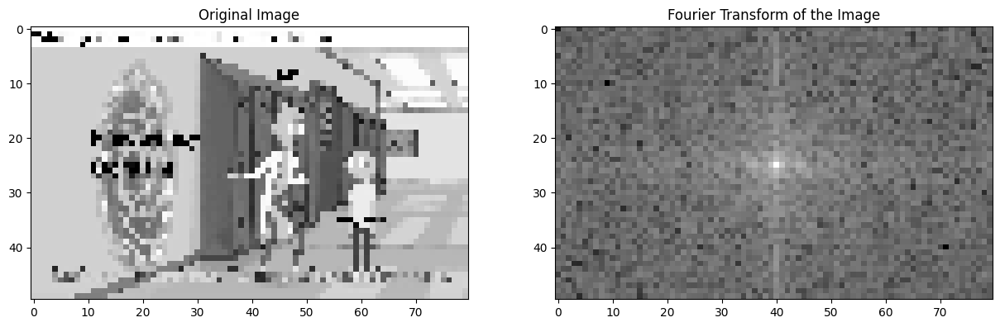

In [ ]:
# Let's compare the result with fourier transform using numpy library

fourier = np.fft.fft2(img)                                                      # compute the 2D Fourier Transform
f_transform_shifted = np.fft.fftshift(fourier)                                  # shift the zero-frequency component
magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted))                   # log magnitude transform - make the frequency components more visible

plot_side_by_side(img, magnitude_spectrum, title2="Fourier Transform of the Image")

## ***Exercise 1.2*** - Implement Inverse Fourier Transform from Scratch

![image](https://github.com/d2l-ai/d2l-en/assets/52993055/40ff8765-f039-411d-8956-1dd64a318b87)

You can refer [here](https://homepages.inf.ed.ac.uk/rbf/HIPR2/fourier.htm) for the details of the formula.

In [ ]:
def ift_2d(F):
    height, width = F.shape
    inverse_F = np.zeros((height, width), dtype=np.complex128)

    # iterate over each pixel (x, y)
    for x in range(height):
        for y in range(width):

            f_x_y = 0       # initialize the sum for the inverse Fourier transformed pixel

            # iterate over each frequency component (u, v)
            for u in range(height):
                for v in range(width):
                    # the contribution of each frequency component to the inverse Fourier transformed image at pixel (x, y)
                    f_x_y += F[u, v] * np.exp(2j * np.pi * ((u * x) / height + (v * y) / width))

            inverse_F[x, y] = f_x_y

    return inverse_F

> When reconstructing images from the frequency domain using inverse Fourier transform, the resulting image may contain both real and imaginary components. Since images are typically represented as arrays of real numbers, we display only the real part for simplicity and visualization purposes. This is because the real part alone provides a visually interpretable representation of the reconstructed image.

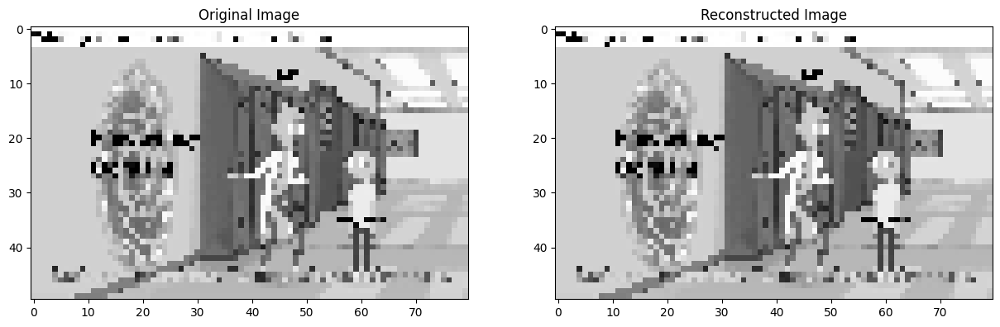

In [ ]:
reconstructed = ift_2d(fourier)                     # apply inverse fourier transform to previosly calculated fourier transform

plot_side_by_side(img, reconstructed.real, title2="Reconstructed Image")

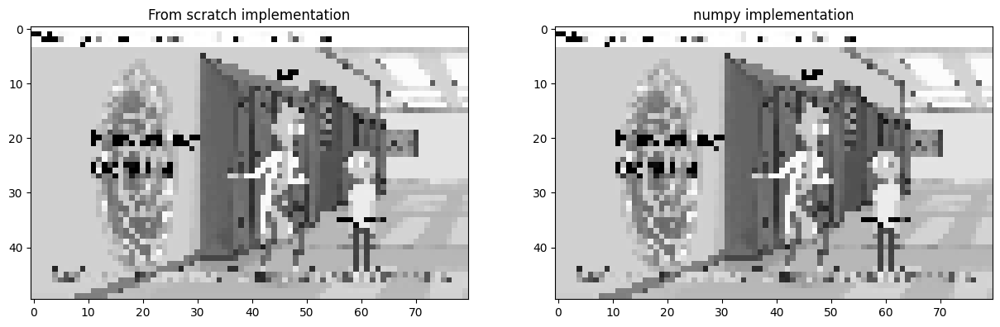

In [ ]:
# Let's compare the result with inverse fourier transform using numpy library

reconstructed_np = np.fft.ifft2(fourier)

plot_side_by_side(reconstructed.real, reconstructed_np.real,  "From scratch implementation", "numpy implementation")

## ***Exercise 1.3*** - Let's see that multiplication in the fourier domain is equivalent to convolution in the spatial domain

![image](https://github.com/d2l-ai/d2l-en/assets/52993055/c856b135-7c83-400c-933c-0da428c3b65a)


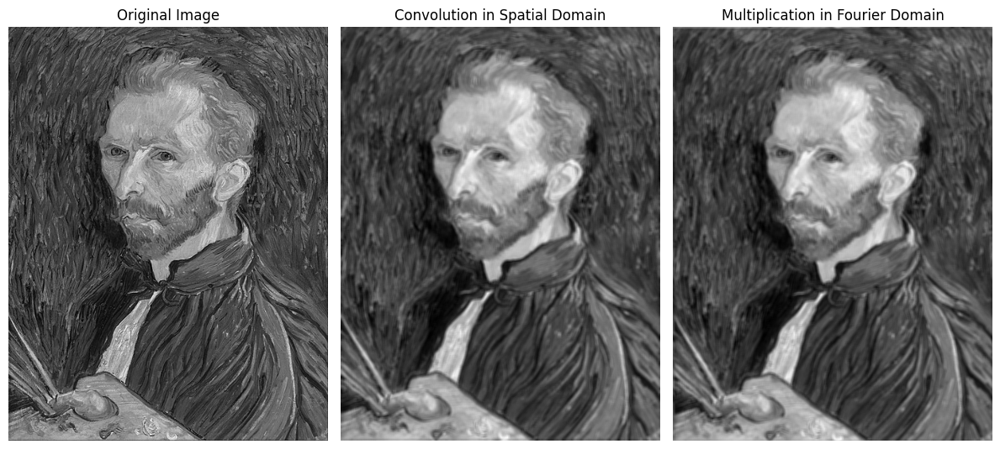

In [ ]:
kernel_size = 5
kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size**2)     # define a mean kernel with size of 5

convolution_result = cv2.filter2D(van_gogh_gray, -1, kernel)                    # apply convolution operation with the kernel

van_gogh_gray_fft = np.fft.fft2(van_gogh_gray)                                  # fourier transform of the image
kernel_fft = np.fft.fft2(kernel, s=van_gogh_gray.shape)                         # fourier transform of the kernel

fft_result = np.fft.ifft2(van_gogh_gray_fft * kernel_fft).real                  # multiplication in the fourier domain

plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(van_gogh_gray, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(convolution_result, cmap='gray')
plt.title('Convolution in Spatial Domain')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(fft_result, cmap='gray')
plt.title('Multiplication in Fourier Domain')
plt.axis('off')

plt.tight_layout()
plt.show()

## High-Pass Filter

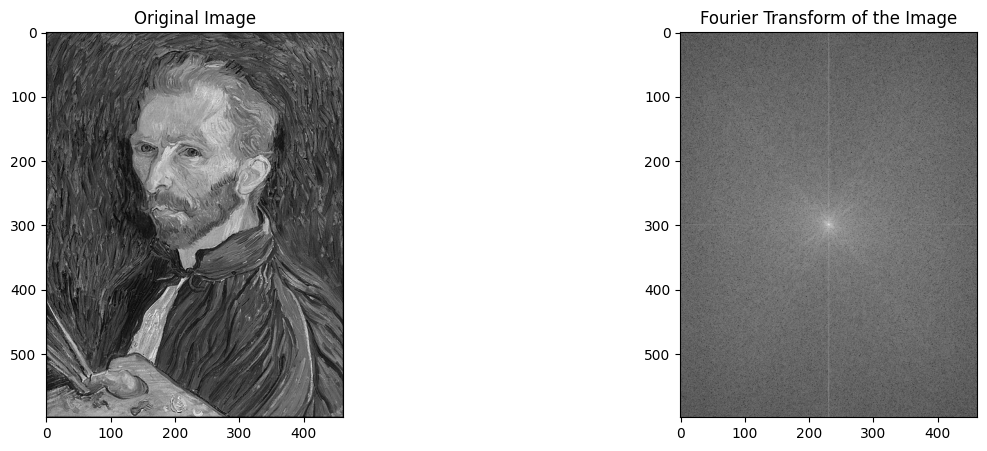

In [ ]:
fourier = np.fft.fft2(van_gogh_gray)                                                # compute the 2d fourier transform
f_transform_shifted = np.fft.fftshift(fourier)                                      # shift the zero-frequency component
magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted))                       # log magnitude transform - make the frequency components more visible

plot_side_by_side(van_gogh_gray, magnitude_spectrum, title2="Fourier Transform of the Image")

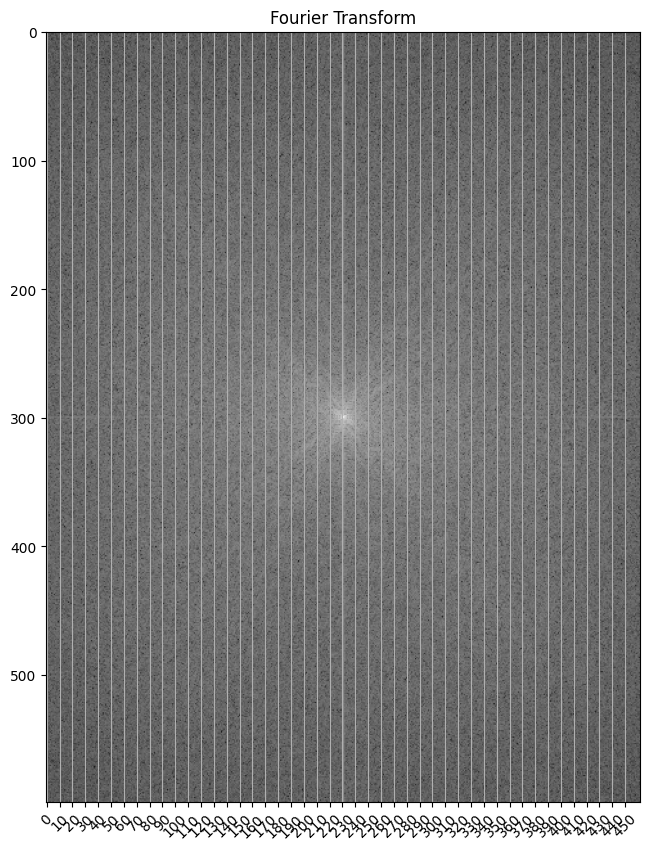

In [ ]:
# let's examine the fourier transform

plt.figure(figsize=(10, 10))
plt.imshow(magnitude_spectrum, cmap='gray')
plt.xticks(np.arange(0, 460, 10), rotation=45)
plt.grid(axis = 'x')
plt.title('Fourier Transform')
plt.show()

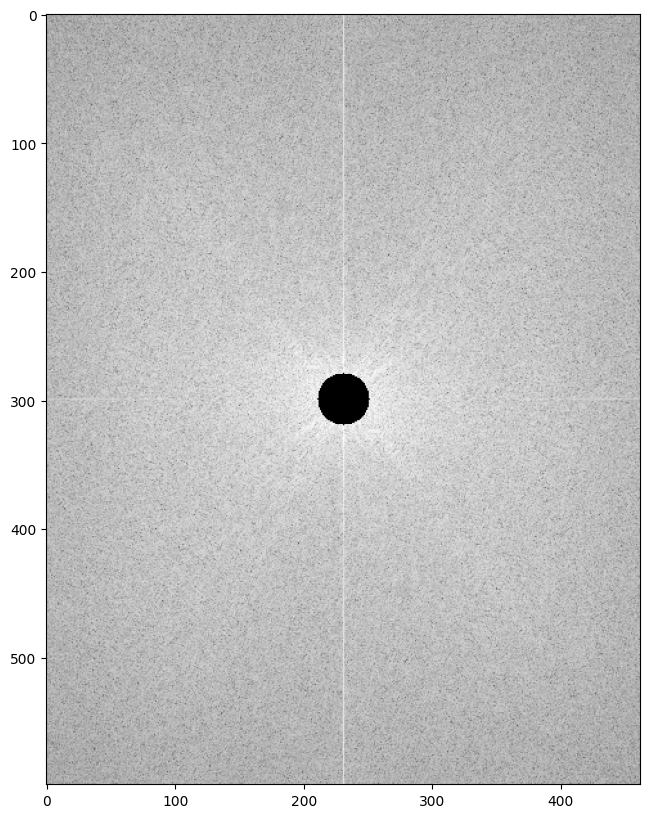

In [ ]:
# let's draw a circle representing our high pass filter

height, width = van_gogh_gray.shape
center_h, center_w = height // 2, width // 2

high_pass_filter = magnitude_spectrum.copy()

radius = 20
thickness = -1

high_pass_filter = cv2.circle(high_pass_filter, (center_w, center_h), radius, 1, thickness)

plt.figure(figsize=(10, 10))
plt.imshow(high_pass_filter, cmap='gray')

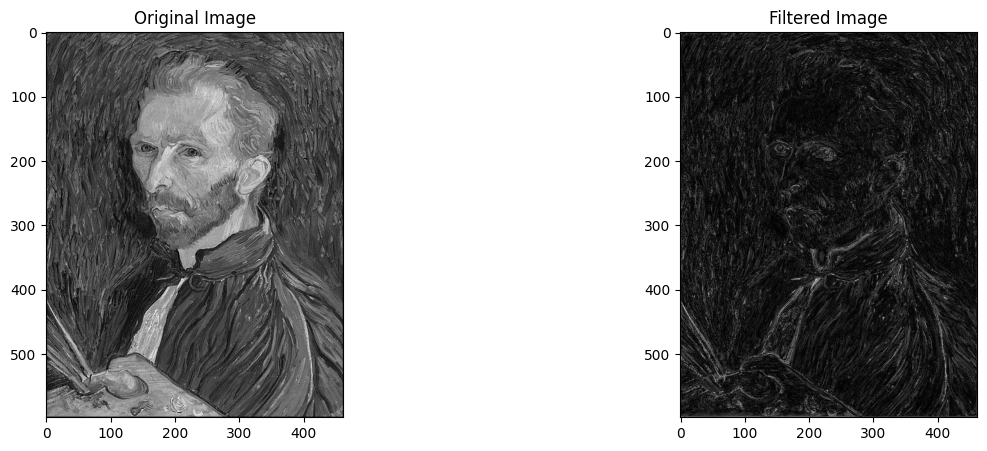

In [ ]:
def high_pass_filter(image, radius, thickness):
    f_transform = np.fft.fft2(image)                                                                # fourier transform
    f_transform_shifted = np.fft.fftshift(f_transform)                                              # shift zero frequency to the center

    height, width = f_transform_shifted.shape
    center_h, center_w = height // 2, width // 2

    filter_mask = np.ones((height, width), dtype=np.uint8)                                          # initialize the filter

    # iterate over each frequency component (u, v)
    for u in range(height):
        for v in range(width):
            distance = np.sqrt((u - center_h) ** 2 + (v - center_w) ** 2)                           # calculate the distance from the center of the frequency domain
            if distance <= radius:                                                                  # if the distance falls within the specified band to be rejected
                filter_mask[u, v] = 0

    f_transform_shifted_filtered = f_transform_shifted * filter_mask                                # apply filter to frequency domain image
    denoised_image = np.abs(np.fft.ifft2(np.fft.ifftshift(f_transform_shifted_filtered)))           # inverse Fourier transform to obtain denoised image

    # the reason for taking the absolute value in this context is related to the nature of complex numbers
    # taking the absolute value effectively removes the imaginary component, resulting in a real-valued image

    return denoised_image, filter_mask

high_pass_filtered, filter = high_pass_filter(van_gogh_gray, radius, thickness)

plot_side_by_side(van_gogh_gray, high_pass_filtered, "Original Image", "Filtered Image")

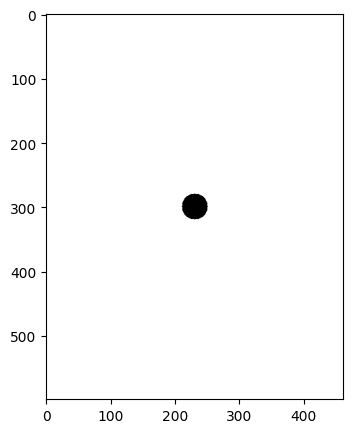

In [ ]:
plt.figure(figsize=(5, 5))
plt.imshow(filter, cmap='gray')

## Low-Pass Filter

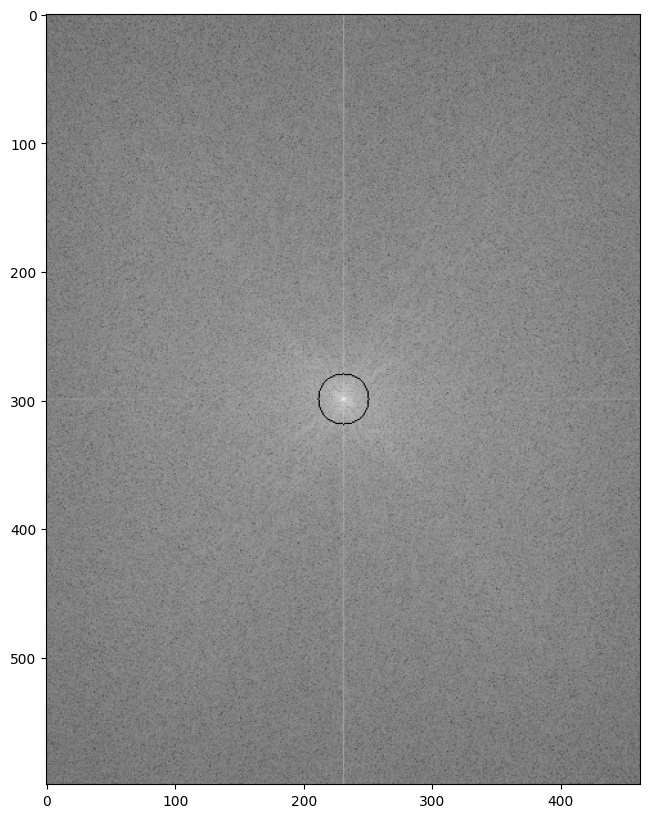

In [ ]:
# let's draw a circle representing our low pass filter

height, width = van_gogh_gray.shape
center_h, center_w = height // 2, width // 2

low_pass_filter = magnitude_spectrum.copy()

radius = 20
thickness = 1

low_pass_filter = cv2.circle(low_pass_filter, (center_w, center_h), radius, 1, thickness)

plt.figure(figsize=(10, 10))
plt.imshow(low_pass_filter, cmap='gray')

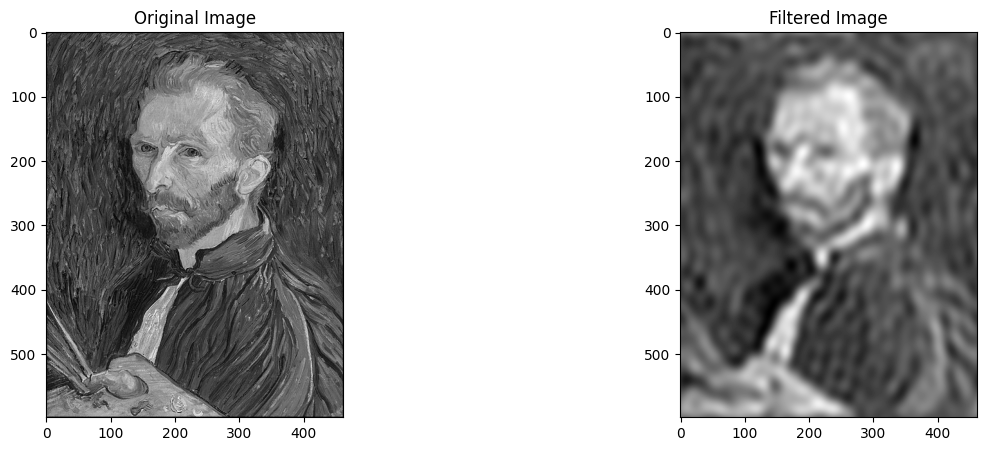

In [ ]:
def low_pass_filter(image, radius, thickness):
    f_transform = np.fft.fft2(image)                                                                # fourier transform
    f_transform_shifted = np.fft.fftshift(f_transform)                                              # shift zero frequency to the center

    height, width = f_transform_shifted.shape
    center_h, center_w = height // 2, width // 2

    filter_mask = np.ones((height, width), dtype=np.uint8)                                          # initialize the filter

    # iterate over each frequency component (u, v)
    for u in range(height):
        for v in range(width):

            distance = np.sqrt((u - center_h) ** 2 + (v - center_w) ** 2)                           # calculate the distance from the center of the frequency domain

            if distance >= radius:                                                                  # if the distance falls within the specified band to be rejected
                filter_mask[u, v] = 0

    f_transform_shifted_filtered = f_transform_shifted * filter_mask                                # apply filter to frequency domain image
    denoised_image = np.abs(np.fft.ifft2(np.fft.ifftshift(f_transform_shifted_filtered)))           # inverse Fourier transform to obtain denoised image

    return denoised_image, filter_mask

low_pass_filter, filter = low_pass_filter(van_gogh_gray, radius, thickness)

plot_side_by_side(van_gogh_gray, low_pass_filter, "Original Image", "Filtered Image")

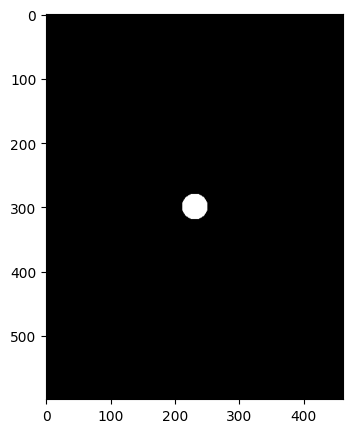

In [ ]:
plt.figure(figsize=(5, 5))
plt.imshow(filter, cmap='gray')

## ***Exercise 1.4*** - You’ll find an aerial image of the city of Pompeii, in the images folder (`pompeii.png`). It is corrupted with sinusoidal noise due to electrical interference. Examine its Fourier transform and implement an appropriate `band reject filter` to denoise it.

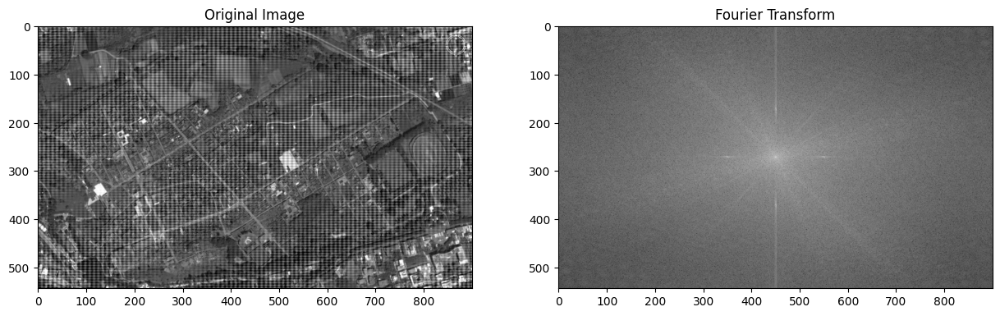

In [ ]:
pompeii = cv2.imread(f"{image_folder}/pompeii.png", 0)
pompeii_fft = np.fft.fft2(pompeii)
pompeii_fft_shifted = np.fft.fftshift(pompeii_fft)

magnitude_spectrum = 20 * np.log(np.abs(pompeii_fft_shifted))

plot_side_by_side(pompeii, magnitude_spectrum, "Original Image", "Fourier Transform")

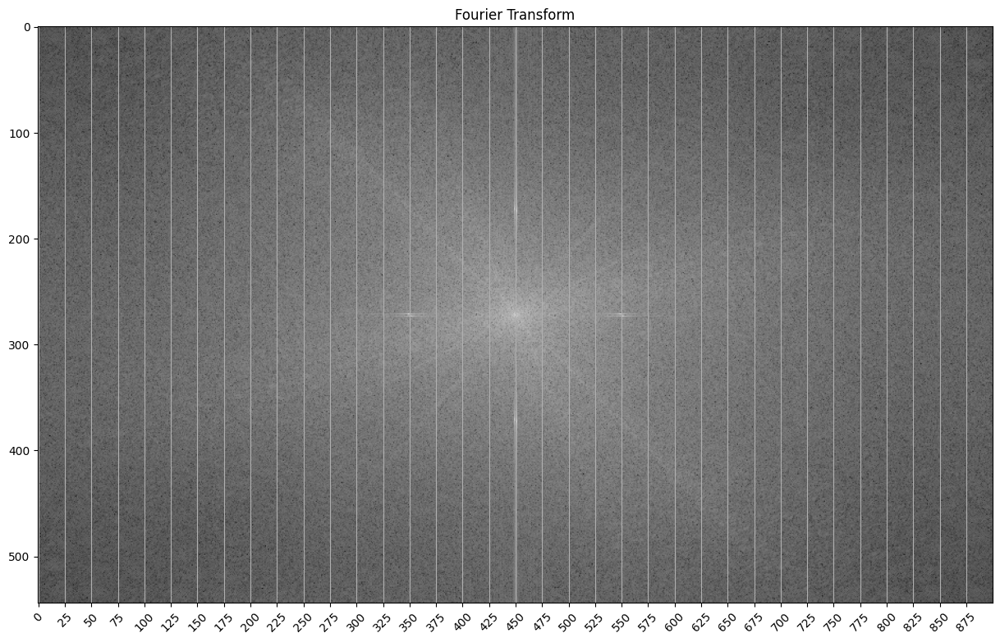

In [ ]:
# Let's take a closer look to the fourier transform

plt.figure(figsize=(15, 15))
plt.imshow(magnitude_spectrum, cmap='gray')
plt.xticks(np.arange(0, 900, 25), rotation=45)
plt.grid(axis = 'x')
plt.title('Fourier Transform')
plt.show()

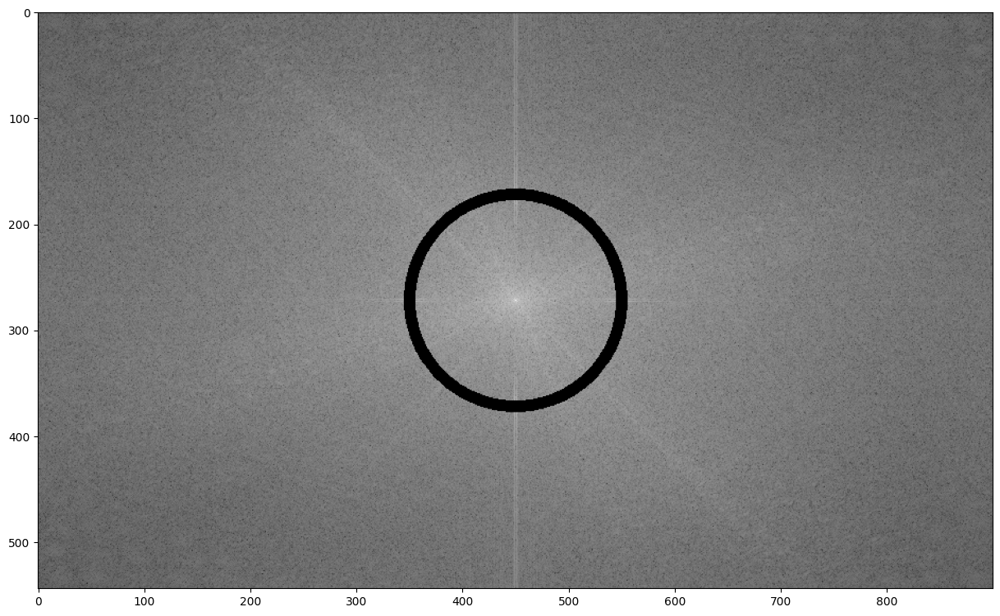

In [ ]:
# Let's draw a circle representing our band_ reject filter

height, width = pompeii.shape
center_h, center_w = height // 2, width // 2

band_rej_filter = magnitude_spectrum.copy()

radius = (550 - 350) // 2
thickness = 20

band_rej_filter = cv2.circle(band_rej_filter, (center_w, center_h), radius, 0, thickness // 2)

plt.figure(figsize=(15, 15))
plt.imshow(band_rej_filter, cmap='gray')

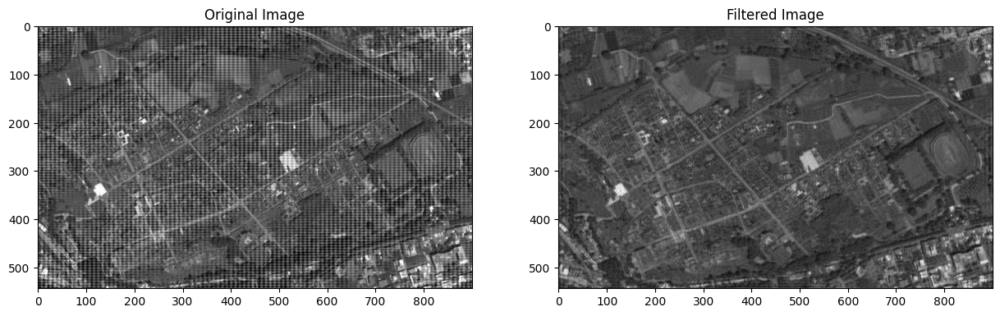

In [ ]:
def band_reject_filter(image, radius, thickness):
    f_transform = np.fft.fft2(image)                                                                # fourier transform
    f_transform_shifted = np.fft.fftshift(f_transform)                                              # shift zero frequency to the center

    height, width = f_transform_shifted.shape
    center_h, center_w = height // 2, width // 2

    filter_mask = np.ones((height, width), dtype=np.uint8)                                          # initialize the filter

    # iterate over each frequency component (u, v)
    for u in range(height):
        for v in range(width):
            distance = np.sqrt((u - center_h) ** 2 + (v - center_w) ** 2)                           # calculate the distance from the center of the frequency domain
            if distance >= (radius - thickness // 2) and distance <= (radius + thickness // 2):     # if the distance falls within the specified band to be rejected
                filter_mask[u, v] = 0

    f_transform_shifted_filtered = f_transform_shifted * filter_mask                                # apply filter to frequency domain image
    denoised_image = np.abs(np.fft.ifft2(np.fft.ifftshift(f_transform_shifted_filtered)))           # inverse Fourier transform to obtain denoised image

    return denoised_image, filter_mask

band_reject_applied, filter = band_reject_filter(pompeii, radius, thickness)

plot_side_by_side(pompeii, band_reject_applied, "Original Image", "Filtered Image")

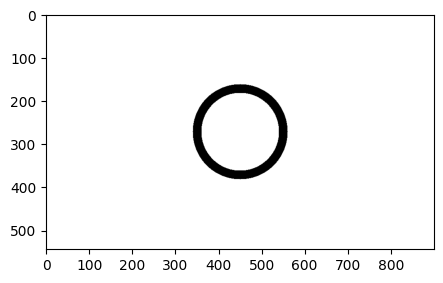

In [ ]:
plt.figure(figsize=(5, 5))
plt.imshow(filter, cmap='gray')

# 2. Harris Corner Detector

![image](https://github.com/d2l-ai/d2l-en/assets/52993055/9e72e08b-a2d0-485f-9aba-7b95035a1eab)


## Corner Detection (with OpenCV)

`cv2.cornerHarris(src, blockSize, kSize, k)`

* `src` – Input Image
* `blockSize` – Neighborhood size (for each pixel value blockSize * blockSize neighbourhood is considered)
* `kSize` – Aperture parameter for the Sobel() operator. *(Sobel is used to calculate the gradient of an image)*
* `k` - Harris detector free parameter.

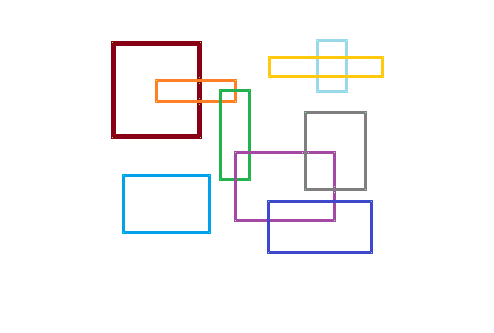

In [ ]:
rectangles = cv2.imread(f"{image_folder}/corner_detection_simple.png")

cv2_imshow(rectangles)

In [ ]:
WINDOW_SIZE = 3
kSize = 3
KAPPA = 0.04
THRESH = 0.01

In [ ]:
rectangles.shape

(333, 494, 3)

(333, 494)
0.067747094


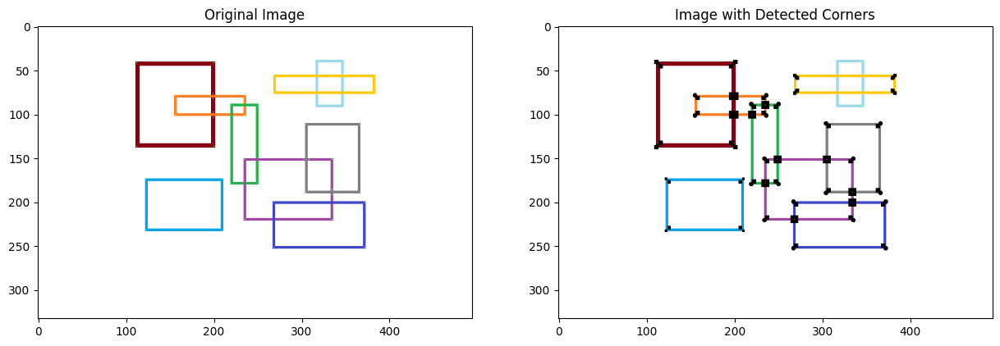

In [ ]:
corner_det_img = rectangles.copy()

corner_img_gray = cv2.cvtColor(rectangles.copy(), cv2.COLOR_RGB2GRAY)

corners = cv2.cornerHarris(corner_img_gray, WINDOW_SIZE, kSize, KAPPA) # cornerHarris typically returns a matrix where each element represents the corner strength at the corresponding pixel location

print(corners.shape)
print(corners.max())

# dilate the result for marking the corners - not important
corners = cv2.dilate(corners, None)

# visualize the corners - do not forget to apply threshold
# Threshold for an optimal value, it may vary depending on the image.
corner_det_img[corners > THRESH * corners.max()] = [0, 0, 0]

plot_side_by_side(rectangles, corner_det_img, "Original Image", "Image with Detected Corners")

> ***Note:*** `corners > THRESH * corners.max()` calculates a threshold value relative to the maximum corner response. Multiplying the threshold value by the maximum corner response ensures that the threshold is proportional to the strength of the corners in the image.

## ***Exercise 2.1*** - Corner Detection (from scratch)

---

1. Compute image gradients over
small region

2. Subtract mean from each image
gradient

3. Compute the covariance matrix

4. Compute eigenvectors and
eigenvalues

5. Use threshold on eigenvalues to
detect corners

---

$R=det(M)−k⋅trace(M)$


In [ ]:
def find_harris_corners(input_img, kappa, window_size, threshold):

    corner_list = []                                # list to store the coordinates of the corners

    output_img = input_img.copy()
    corner_img = cv2.cvtColor(output_img, cv2.COLOR_RGB2GRAY)


    offset = int(window_size/2)

    y_range = corner_img.shape[0] - offset          # define the max y value of the image to be searched
    x_range = corner_img.shape[1] - offset          # define the max x value of the image to be searched

    # compute image gradients
    dy, dx = np.gradient(corner_img)                # compute the gradient of the image in both the x and y directions

    # dy -= np.mean(dy)                               # subtract the mean from each image gradient
    # dx -= np.mean(dx)

    Ixx = dx**2                                     # compute the Ixx, Ixy, and Iyy components of the Harris matrix
    Ixy = dy*dx
    Iyy = dy**2

    for y in range(offset, y_range):
        for x in range(offset, x_range):

            # define a small region around the current pixel using a sliding window
            start_y = y - offset
            end_y = y + offset + 1
            start_x = x - offset
            end_x = x + offset + 1

            windowIxx = Ixx[start_y : end_y, start_x : end_x]
            windowIxy = Ixy[start_y : end_y, start_x : end_x]
            windowIyy = Iyy[start_y : end_y, start_x : end_x]

            # compute the covariance matrix - M
            Sxx = windowIxx.sum()                   # sum of squares of intensities of partial derevative Ixx
            Sxy = windowIxy.sum()                   # sum of squares of intensities of partial derevative Ixy
            Syy = windowIyy.sum()                   # sum of squares of intensities of partial derevative Iyy

            det = (Sxx * Syy) - (Sxy**2)            # calculate determinant
            trace = Sxx + Syy                       # calculate trace of the covariance matrix

            r = det - kappa*(trace**2)              # calculate the Harris response r

            if r > threshold:                       # apply threshold - if r is above the threshold, marks it as a corner
                corner_list.append([x, y, r])
                output_img[y,x] = (0, 0, 0)

    return corner_list, output_img

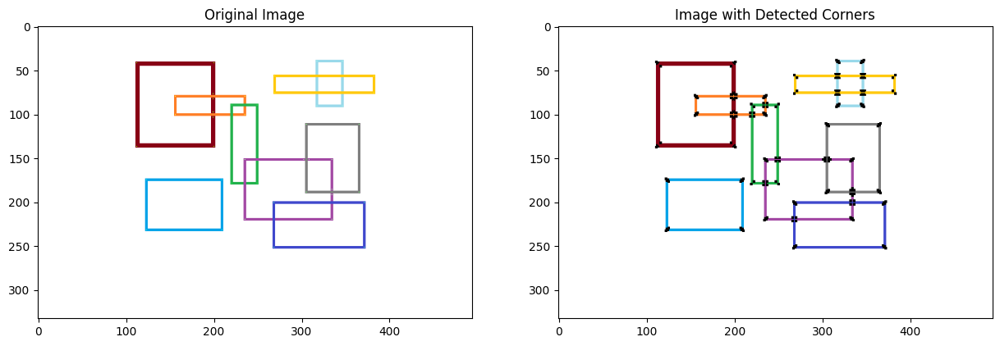

In [ ]:
corners, image_w_corners = find_harris_corners(rectangles, kappa=KAPPA, window_size=WINDOW_SIZE, threshold=THRESH)

plot_side_by_side(rectangles, image_w_corners, "Original Image", "Image with Detected Corners")

## Exercise 2.2 - Let's make things interesting!

Let's use a real-world image for corner detection.

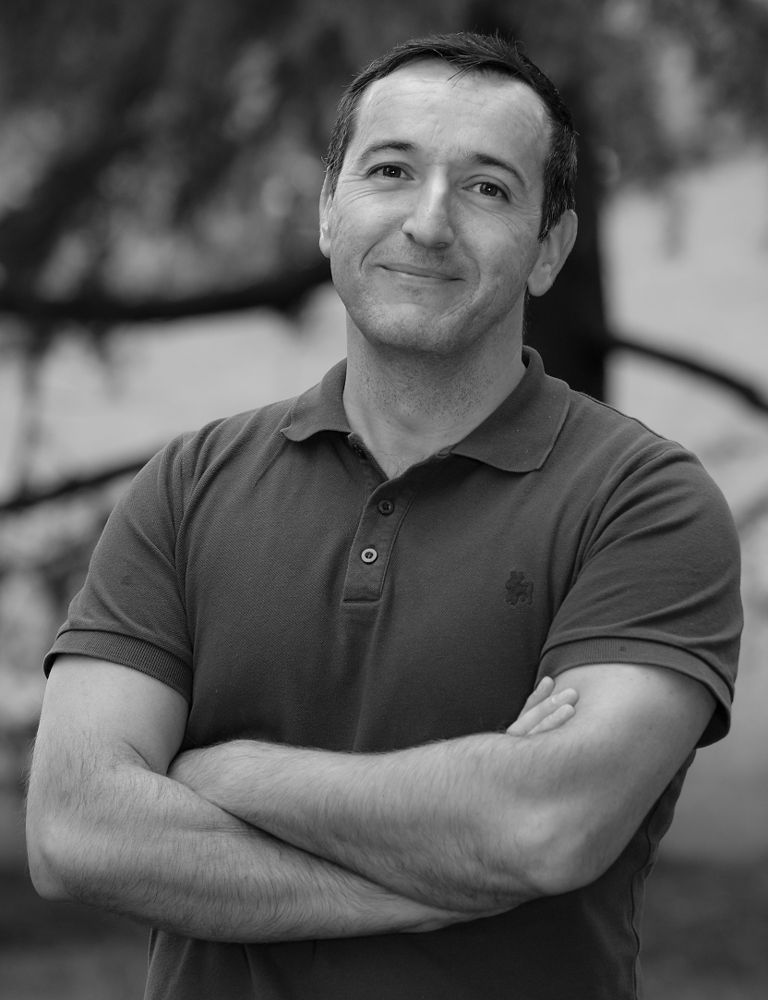

In [ ]:
e_aptoula = cv2.imread(f"{image_folder}/erchan_aptoula.png", 0)

cv2_imshow(e_aptoula)

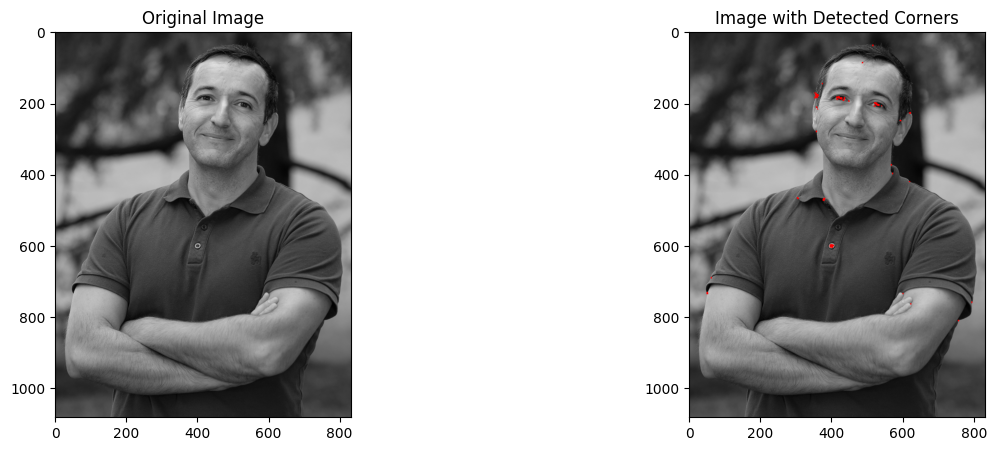

In [ ]:
corner_det_img = cv2.cvtColor(e_aptoula, cv2.COLOR_GRAY2RGB)

corners = cv2.cornerHarris(e_aptoula, WINDOW_SIZE, kSize, KAPPA)

corners = cv2.dilate(corners, None)

corner_det_img[corners > THRESH * corners.max()] = [0, 0, 255]

plot_side_by_side(e_aptoula, corner_det_img, "Original Image", "Image with Detected Corners")

## ***Exercise 2.3*** - Effect of Kappa and Threshold Parameters on Harris Corner Detection

Try using different kappa and threshold values for corner detection to see their effect on the resulting images.

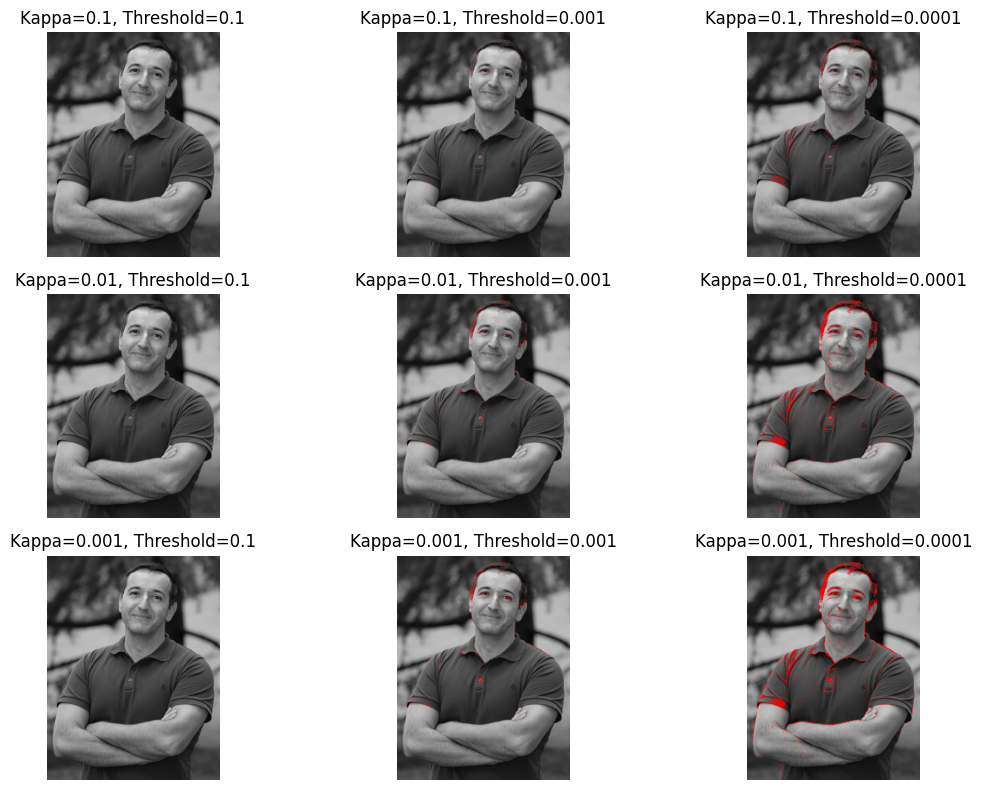

In [ ]:
kappa_values = [0.1, 0.01, 0.001]
threshold_values = [0.1, 0.001, 0.0001]

fig, axes = plt.subplots(len(kappa_values), len(threshold_values), figsize=(12, 8))


for i, kappa in enumerate(kappa_values):
    for j, threshold in enumerate(threshold_values):
        # Perform Harris corner detection
        corners = cv2.cornerHarris(e_aptoula, 2, 3, kappa)

        # Mark corners on the image
        marked_image = cv2.cvtColor(e_aptoula, cv2.COLOR_GRAY2RGB)
        marked_image[corners > threshold * corners.max()] = [0, 0, 255]

        # Display the result
        axes[i, j].imshow(cv2.cvtColor(marked_image, cv2.COLOR_BGR2RGB))
        axes[i, j].set_title(f'Kappa={kappa}, Threshold={threshold}')
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()

# 3. Descriptors

## ***Exercise 3.1*** - Detect corners on the given images. Try to match the corners you find using descriptors.

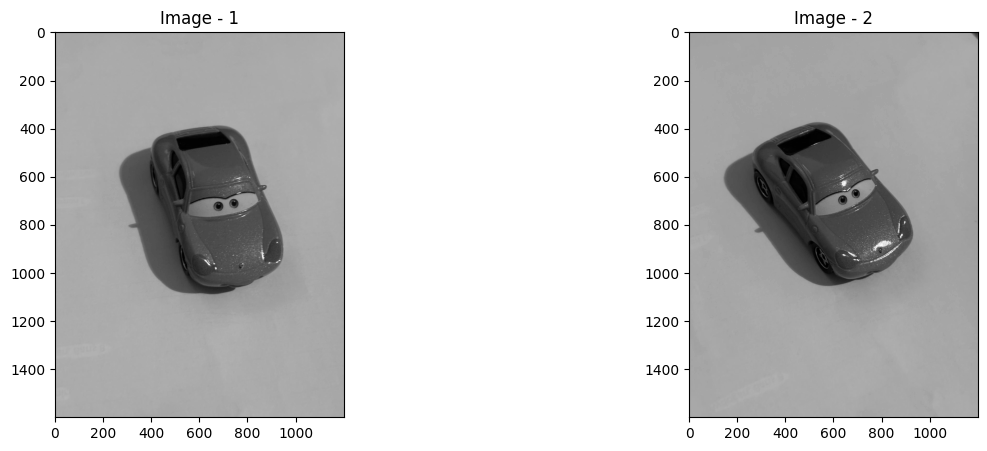

In [ ]:
sally_1 = cv2.imread(f"{image_folder}/sally_1.jpg", 0)
sally_2 = cv2.imread(f"{image_folder}/sally_2.jpg", 0)

plot_side_by_side(sally_1, sally_2, "Image - 1", "Image - 2")

In [ ]:
WINDOW_SIZE = 10
KSIZE = 3
KAPPA = 0.04
THRESH = 0.1

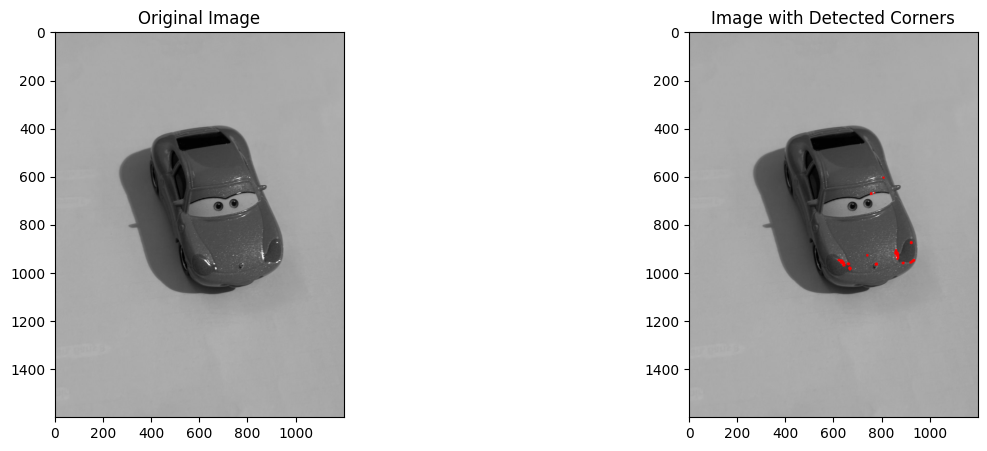

In [ ]:
corner_det_img = cv2.cvtColor(sally_1, cv2.COLOR_GRAY2RGB)

corners = cv2.cornerHarris(sally_1, WINDOW_SIZE, KSIZE, KAPPA)

corners = cv2.dilate(corners, None)

corner_det_img[corners > THRESH * corners.max()] = [0, 0, 255]

plot_side_by_side(sally_1, corner_det_img, "Original Image", f"Image with Detected Corners")

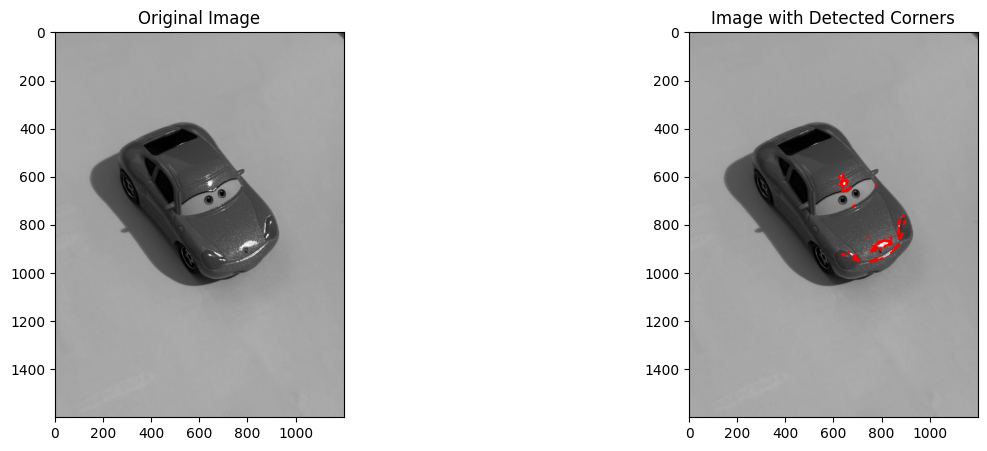

In [ ]:
corner_det_img = cv2.cvtColor(sally_2, cv2.COLOR_GRAY2RGB)

corners = cv2.cornerHarris(sally_2, WINDOW_SIZE, KSIZE, KAPPA)

corners = cv2.dilate(corners, None)

corner_det_img[corners > THRESH * corners.max()] = [0, 0, 255]

plot_side_by_side(sally_2, corner_det_img, "Original Image", f"Image with Detected Corners")

In [ ]:
def draw_matches(img1, kp1, img2, kp2, matches):
    """
    Helper function for drawing the matches on two different images.

    img1: image 1
    kp1: key points of the first image
    img2: second image
    kp2: key points of second image
    matches: matched points of the images
    """

    result = np.zeros((max(img1.shape[0], img2.shape[0]), img1.shape[1] + img2.shape[1]), dtype=np.uint8)
    result[:img1.shape[0], :img1.shape[1]] = img1
    result[:img2.shape[0], img1.shape[1]:] = img2

    for match in matches:
        idx1, idx2, _ = match
        pt1 = (int(kp1[idx1][1]), int(kp1[idx1][0]))
        pt2 = (int(kp2[idx2][1]) + img1.shape[1], int(kp2[idx2][0]))
        cv2.line(result, pt1, pt2, (0, 255, 0), 1)

    return result

In [ ]:
N = 20                                                                      # number of matches to select

### ***Exercise 3.1.1*** - Use histograms as a descriptor.

PS. You can use euclidean distance for the comparison.

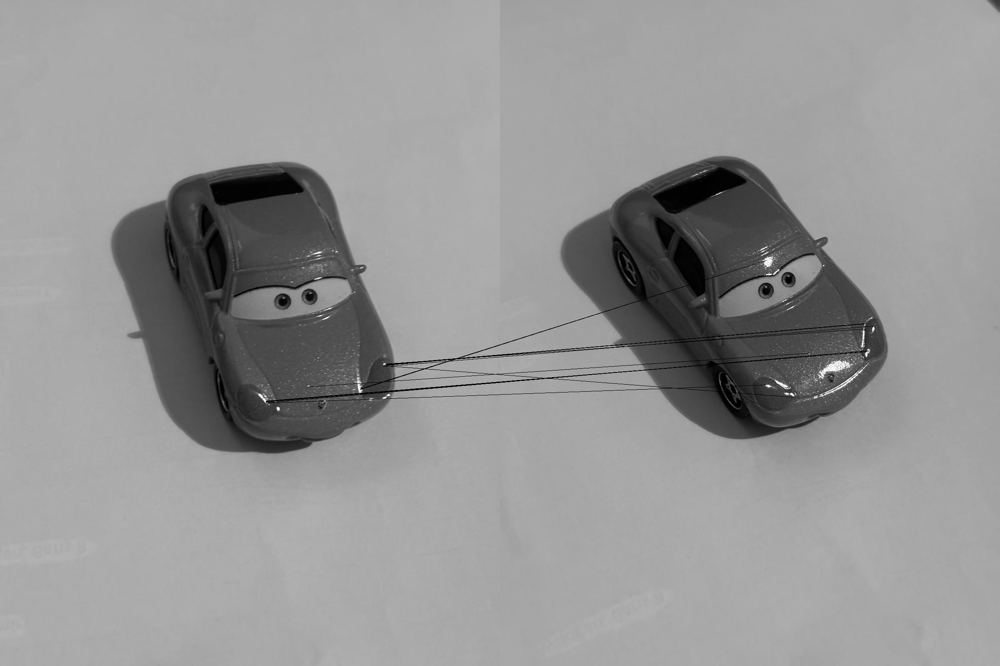

In [ ]:
def find_corners(img, window_size=WINDOW_SIZE, ksize=KSIZE, kappa=KAPPA, threshold=THRESH):
    corners = cv2.cornerHarris(img, window_size, ksize, kappa)                                  # compute Harris corners - strength
    corners = np.argwhere(corners > threshold * corners.max())                                  # thresholding
    return corners


def compute_histogram(image):
    hist = cv2.calcHist([image], [0], None, [256], [0, 256])                                    # compute histogram of the image
    hist = cv2.normalize(hist, hist).flatten()                                                  # normalize histogram
    return hist


def get_descriptors(img, corners):
    return np.array([compute_histogram(img[y-5:y+5, x-5:x+5]) for y, x in corners])             # compute histogram for each corner
    # window of 11x11


def corner_matching(img1, img2, corners1, corners2, threshold=0.7):
    # Compute histograms for corners
    desc1 = get_descriptors(img1, corners1)                                                     # compute histograms for corners in the first image
    desc2 = get_descriptors(img2, corners2)                                                     # compute histograms for corners in the second image

    # Brute force matching
    matches = []                                                                                # list to store matches
    for i in range(len(corners1)):
        best_match_index = -1                                                                   # initialize best match index
        best_match_score = threshold                                                            # initialize best match score

        for j in range(len(corners2)):                                                          # iterate over corners in the second image
            distance = np.linalg.norm(desc1[i] - desc2[j])                                      # compute distance between histograms

            if distance < best_match_score:                                                     # if distance is less than best match score
                best_match_index = j                                                            # update best match index
                best_match_score = distance                                                     # update best match score

        if best_match_index != -1:                                                              # if best match index is not -1
            matches.append((i, best_match_index, best_match_score))                             # add match to the list

    matches = sorted(matches, key=lambda x: x[2])                                               # sort matches by similarity

    return matches

corners1 = find_corners(sally_1)                                                                # find corners in the first image
corners2 = find_corners(sally_2)                                                                # find corners in the second image

matches = corner_matching(sally_1, sally_2, corners1, corners2)                                 # perform corner matching

matches = matches[:N]                                                                           # select first 10 matches

result = draw_matches(sally_1, corners1, sally_2, corners2, matches)                            # draw matches

cv2_imshow(result)

### ***Exercise 3.1.2*** - Use HOG as a descriptor. Implement HOG from scratch - do not use `cv2.HOGDescriptor()` !

PS. You can use euclidean distance for the comparison.

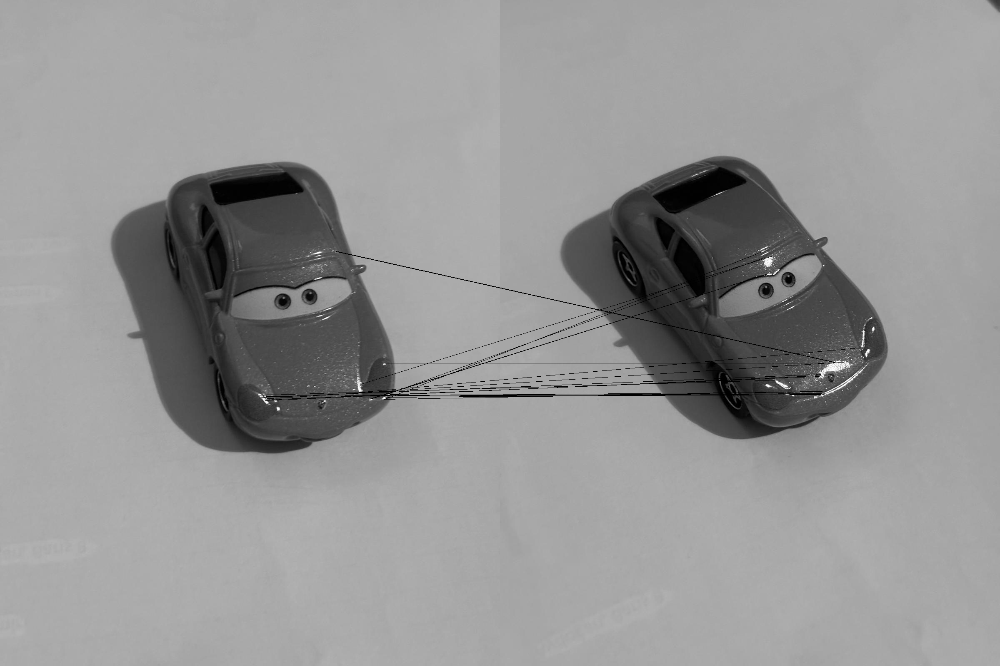

In [ ]:
def calculate_gradients(image):
    # calculate gradients using Sobel operator
    gradient_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=1)                    # gradient in x-direction
    gradient_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=1)                    # gradient in y-direction

    magnitude = np.sqrt(gradient_x ** 2 + gradient_y ** 2)                      # gradient magnitude
    orientation = np.arctan2(gradient_y, gradient_x) * (180 / np.pi) % 180      # gradient orientation
    # arctangent - radians to degrees - ensure that the angles are within the range [0, 180) [takes the remainder of the division of the angles by 180]

    return magnitude, orientation

def calculate_histogram(gradient_magnitude, gradient_orientation, num_bins):

    # bins refer to the bins in the histogram used to represent the distribution of gradient orientations
    # here we used 9 orientation for the gradients

    histogram = np.zeros((int(180 / num_bins), ))                               # initialize histogram array
    # this means that each bin corresponds to a range of 20 degrees in the orientation space

    # Loop over each pixel in the cell
    for i in range(gradient_magnitude.shape[0]):
        for j in range(gradient_magnitude.shape[1]):
            bin_index = int(gradient_orientation[i, j] / (180 / num_bins))      # calculate the corresponding histogram bin - to determine which bin the orientation falls into
            histogram[bin_index] += gradient_magnitude[i, j]                    # update the histogram bin with magnitude
            # this effectively accumulates the magnitudes of gradients in each orientation bin

    return histogram

def normalize_histogram(histogram):
    # L2 normalization
    # to ensure that the feature representation is invariant to changes in scale and magnitude
    norm_factor = np.sqrt(np.sum(histogram ** 2) + 1e-6)                        # calculate normalization factor
    normalized_histogram = histogram / norm_factor                              # normalize the histogram
    return normalized_histogram

def compute_hog_descriptor(image, num_bins=9):
    """This function computes the HOG descriptor for the entire image.
    It divides the image into cells and calculates histograms for each cell.
    The histograms are normalized and concatenated to form the final HOG descriptor."""

    magnitude, orientation = calculate_gradients(image)                                             # compute gradient magnitude and orientation

    histogram = calculate_histogram(magnitude, orientation, num_bins)                               # calculate histogram for the cell

    normalized_histogram = normalize_histogram(histogram)                                           # normalize histogram

    return np.array(normalized_histogram)

def get_descriptors(img, corners, cell_size=5):
    descriptors = []

    for y, x in corners:

        patch = img[max(0, y - cell_size):min(img.shape[0], y + cell_size+1),
                    max(0, x - cell_size):min(img.shape[1], x + cell_size+1)]

        descriptor = compute_hog_descriptor(patch)

        descriptors.append(descriptor)

    return np.array(descriptors)

def corner_matching(img1, img2, corners1, corners2, dist_threshold=0.7):
    desc1 = get_descriptors(img1, corners1)                             # compute HOG descriptor for each corner in image 1
    desc2 = get_descriptors(img2, corners2)                             # compute HOG descriptor for each corner in image 2

    matches = []                                                        # initialize matches array
    for i in range(len(corners1)):                                      # loop over each corner in image 1
        best_match_index = -1                                           # initialize best match index
        best_match_score = dist_threshold                               # initialize best match score

        for j in range(len(corners2)):                                  # loop over each corner in image 2
            distance = np.linalg.norm(desc1[i] - desc2[j])              # calculate euclidean distance between descriptors

            if distance < best_match_score:                             # if distance is less than best match score
                best_match_index = j                                    # update best match index
                best_match_score = distance                             # update best match score

        if best_match_index != -1:                                      # if best match index is found
            matches.append((i, best_match_index, best_match_score))     # add the match to the matches array

    matches = sorted(matches, key=lambda x: x[2])                       # sort matches based on similarity score

    return matches

# Perform brute-force matching
matches = corner_matching(sally_1, sally_2, corners1, corners2)         # find matches

matches = matches[:N]

# draw matches
result = draw_matches(sally_1, corners1, sally_2, corners2, matches)    # draw matches

cv2_imshow(result)

### ***Exercise 3.1.3*** - Use HOG as a descriptor again. This time use OpenCV for HOG and Brute Force implementation.

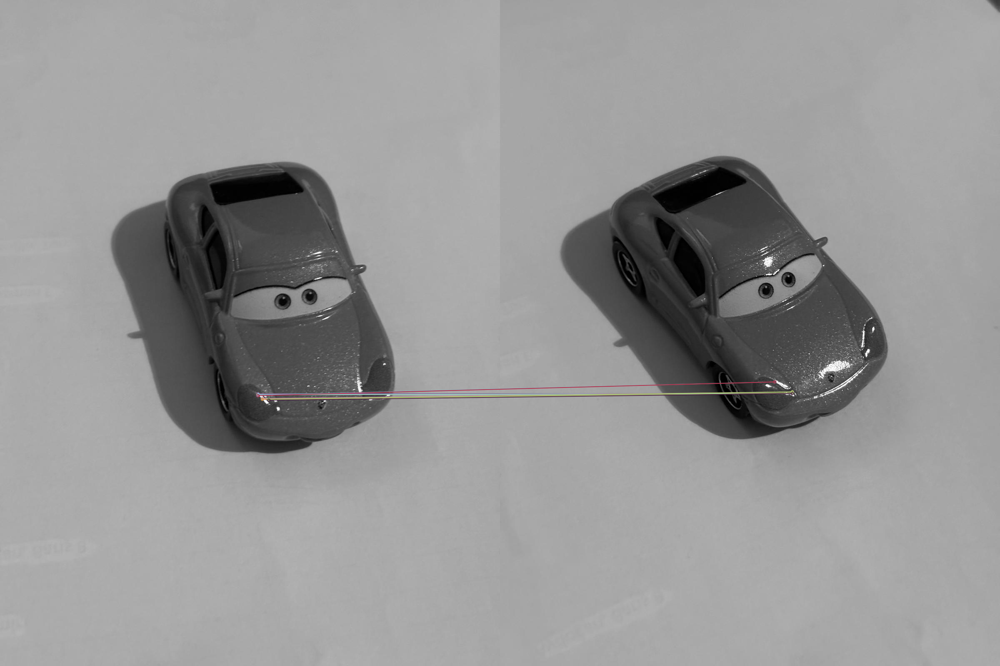

In [ ]:
winSize = (10, 10)                                                          # patch size for HOG descriptor computation
blockSize = (5, 5)                                                          # size of blocks for HOG computation
blockStride = (5, 5)                                                        # block stride
cellSize = (5, 5)                                                           # cell size
nbins = 9                                                                   # number of bins for the histogram
hog = cv2.HOGDescriptor(winSize, blockSize, blockStride, cellSize, nbins)

descriptors1 = []                                                           # list to store the HOG descriptors for the first image
descriptors2 = []                                                           # list to store the HOG descriptors for the second image

def compute_hog_cv2(img, corners):                                          # function to compute HOG descriptors using OpenCV
    descriptors = []                                                        # list to store the HOG descriptors

    for corner in corners:                                                  # iterate over the corners
        x, y = corner.astype(int)                                           # get the x and y coordinates of the corner
        patch = img[y - 5:y + 5, x - 5:x + 5]                               # extract a 10x10 patch around the corner
        descriptor = hog.compute(patch)                                     # compute the HOG descriptor for the patch
        descriptors.append(descriptor)                                      # store the descriptor

    descriptors = np.array(descriptors)                                     # convert the list to a NumPy array

    return descriptors

descriptors1 = compute_hog_cv2(sally_1, corners1)                           # compute HOG descriptors for the first image
descriptors2 = compute_hog_cv2(sally_2, corners2)                           # compute HOG descriptors for the second image

bf = cv2.BFMatcher()                                                        # initialize a Brute-Force Matcher

matches = bf.match(descriptors1, descriptors2)                              # match the HOG descriptors

matches = sorted(matches, key=lambda x: x.distance)                         # sort the matches based on distance

best_matches = matches[:N]                                                  # select the top N matches

corners1_kp = [cv2.KeyPoint(float(x[1]), float(x[0]), 1) for x in corners1] # convert the corners to KeyPoint objects
corners2_kp = [cv2.KeyPoint(float(x[1]), float(x[0]), 1) for x in corners2] # convert the corners to KeyPoint objects

# Draw matches
img_matches = cv2.drawMatches(sally_1, corners1_kp, sally_2, corners2_kp, best_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(img_matches)